# TopAGNPS watershed delineation quality control

- After TopAGNPS has delineated a watershed, the final result is checked for quality control:
    - Cells coverage vs. initial THUC boundary
    - Check if delineation reached the edge of the DEM

In [6]:
import sys
sys.path.append('..')
import geopandas as gpd

from pyagnps import topagnps, utils

In [7]:
import importlib
importlib.reload(utils);

<module 'pyagnps.utils' from 'c:\\Users\\Luc\\projects\\pyagnps\\src\\notebooks\\..\\pyagnps\\utils.py'>

## Paths to TopAGNPS runs and THUC shapefile

In [2]:
path_to_thucs = 'C:/Users/Luc/projects/pyagnps/inputs/thucs/tophuc_S_40000.gpkg'
thucs = gpd.read_file(path_to_thucs)

In [3]:
thuc_id = '1175'

thuc_select = thucs[thucs['tophucid']==thuc_id]
thuc_select

,tophucid,drainage_area_sqkm,outlethuc12,outlethuc12_hutype,receivinghuc12,contained_hucs,num_contained_hucs,foreign_inflows,num_foreign_inflows,totophuc,bbox_area_sqkm,tophucid_bbox_container,geometry
1167,1175,1394.19,070801041806,S,071100010601,"070801041704,070801041701,070801041803,0708010...",12,"070801041302,070801041605,070801071006,0708010...",7,1177,2802.375316,None,"POLYGON ((-91.28058 40.38634, -91.28122 40.385..."


In [4]:
thuc_dir_path = 'C:/Users/Luc/projects/pyagnps/outputs/topagnps'
thucid_dir_name = f'thuc_{thuc_id}_hydrodem_shifted_98966_cm_unwalled_4800_m'
thuc_topagnps_path = f'{thuc_dir_path}/{thucid_dir_name}'
path_to_cell_IDs_asc = f'{thuc_topagnps_path}/AnnAGNPS_Cell_IDs.asc'

In [71]:
cells = utils.polygonize_cell_reach_IDs_asc(path_to_cell_IDs_asc, outepsg=4326, return_gdf=True, writefile=False)

In [72]:
utm = cells.estimate_utm_crs()

cells_bounds = cells.to_crs(utm).buffer(0.01).unary_union


In [83]:
thuc_select = thuc_select.to_crs(utm)
thuc_bounds = thuc_select.geometry.iloc[0]

In [92]:
thuc_minus_cells = thuc_bounds.difference(cells_bounds)
cells_minus_thuc = cells_bounds.difference(thuc_bounds)
intersection = thuc_bounds.intersection(cells_bounds)

In [94]:
cells_bounds

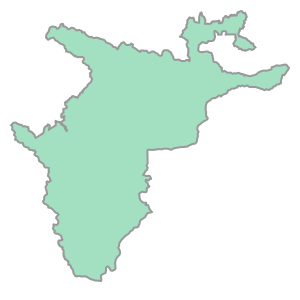

In [99]:
thuc_bounds

In [90]:
thuc_minus_cells

In [91]:
cells_minus_thuc

In [93]:
intersection

In [103]:
fraction_of_thuc_covered = intersection.area/thuc_bounds.area
fraction_of_thuc_covered

0.9815984202793046

In [104]:
fraction_of_thuc_missed = 1 - fraction_of_thuc_covered
fraction_of_thuc_missed

0.01840157972069545

In [69]:
bounds = gpd.GeoDataFrame({'cells_bounds': cells_bounds}, geometry='cells_bounds', index=[0], crs=utm)

NameError: name 'cells_bounds' is not defined

In [56]:
bounds.area

0    1.551865e+09
dtype: float64

In [106]:
path_to_topagnps_wrn = f'{thuc_topagnps_path}/TopAGNPS_wrn.CSV'

In [108]:
with open(path_to_topagnps_wrn, 'r') as topwarn:
    touch_edges = [line for line in topwarn if 'The watershed boundary touches' in line]

print(touch_edges)


['DEDNM,WARNING, 2021,The watershed boundary touches the North edge of the DEM along the first row. Location: row "1" and column " 1138". Processing will continue!\n', 'DEDNM,WARNING, 2023,The watershed boundary touches the West edge of the DEM along the first column. Location: row "  635" and column "1". Processing will continue!\n', 'DEDNM,WARNING, 2024,The watershed boundary touches the East edge of the DEM along the last column. Location: row "  791" and column " 5405". Processing will continue!\n']
